#Data and Dependencies

In [3]:
!pip install ydata-profiling

  Using cached ydata_profiling-4.12.0-py2.py3-none-any.whl.metadata (20 kB)
Using cached ydata_profiling-4.12.0-py2.py3-none-any.whl (390 kB)


In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import ydata_profiling as yp
import seaborn as sns
from sklearn.model_selection import train_test_split

In [32]:
url = 'https://raw.githubusercontent.com/izzarhm/Customer-Subscription-Prediction/refs/heads/main/bank-additional-full.csv'
bank_data = pd.read_csv(url, sep=';')
bank_data.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


#EDA

In [6]:
bank_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

In [7]:
bank_data.describe()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,41188.00000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000
mean,40.02406,258.285010,2.567593,962.475454,0.172963,0.081886,93.575664,-40.502600,3.621291,5167.035911
std,10.42125,259.279249,2.770014,186.910907,0.494901,1.570960,0.578840,4.628198,1.734447,72.251528
min,17.00000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,32.00000,102.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,38.00000,180.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,47.00000,319.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,98.00000,4918.000000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


In [8]:
bank_data.isna().sum()

,0
age,0
job,0
marital,0
education,0
default,0
housing,0
loan,0
contact,0
month,0
day_of_week,0


In [9]:
bank_data.nunique()

,0
age,78
job,12
marital,4
education,8
default,3
housing,3
loan,3
contact,2
month,10
day_of_week,5


In [10]:
yp.ProfileReport(bank_data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

##cek imbalance for target

Target values counts: 
 y
no     36548
yes     4640
Name: count, dtype: int64


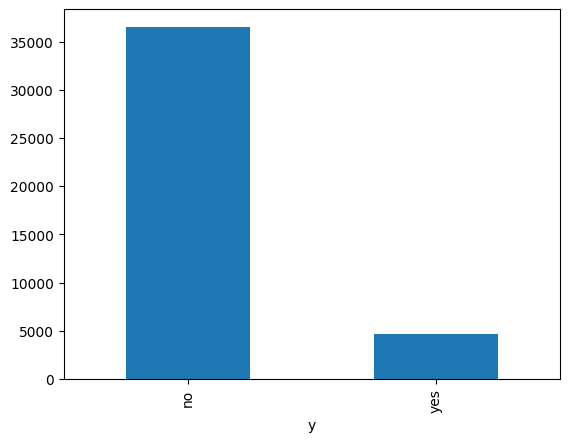

In [11]:
print("Target values counts: \n",bank_data['y'].value_counts())
bank_data['y'].value_counts().plot.bar()
plt.show()

##checking outliers

###numerical columns using boxplot



In [12]:
numerical_columns = bank_data.select_dtypes(include=['number']).columns.tolist()

print("Kolom numerik dalam dataset:")
print(numerical_columns)


Kolom numerik dalam dataset:
['age', 'duration', 'campaign', 'pdays', 'previous', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed']


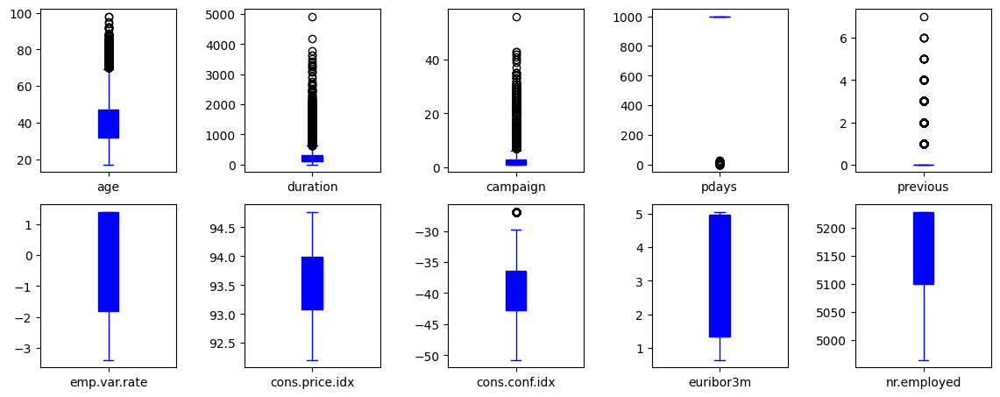

In [13]:
numeric_data=bank_data.select_dtypes(exclude=["object"])
numeric_data.plot(subplots =True, kind = 'box', layout = (5,5), figsize = (14,14),patch_artist=True,color="b")
plt.subplots_adjust(wspace = 0.5)

###categorical columns (check distribution)

<ipython-input-14-f58cad81ba48>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=bank_data, palette='pastel')


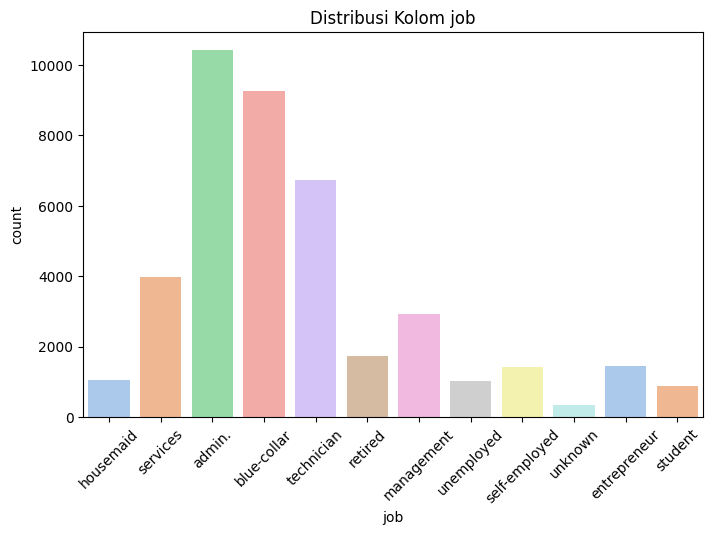

<ipython-input-14-f58cad81ba48>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=bank_data, palette='pastel')


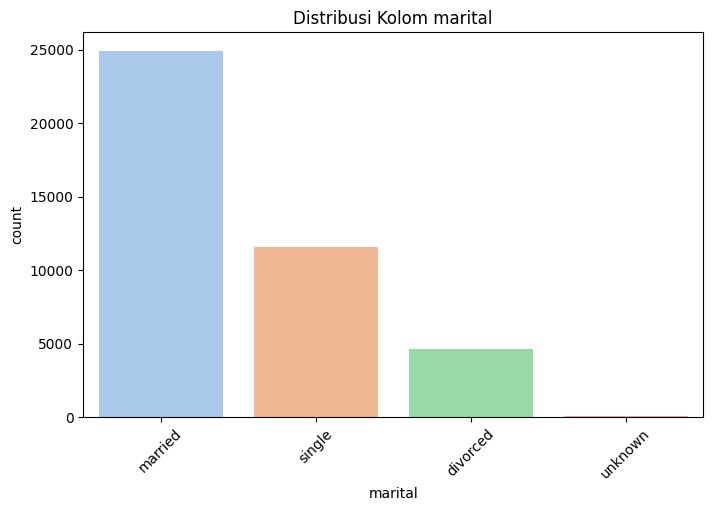

<ipython-input-14-f58cad81ba48>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=bank_data, palette='pastel')


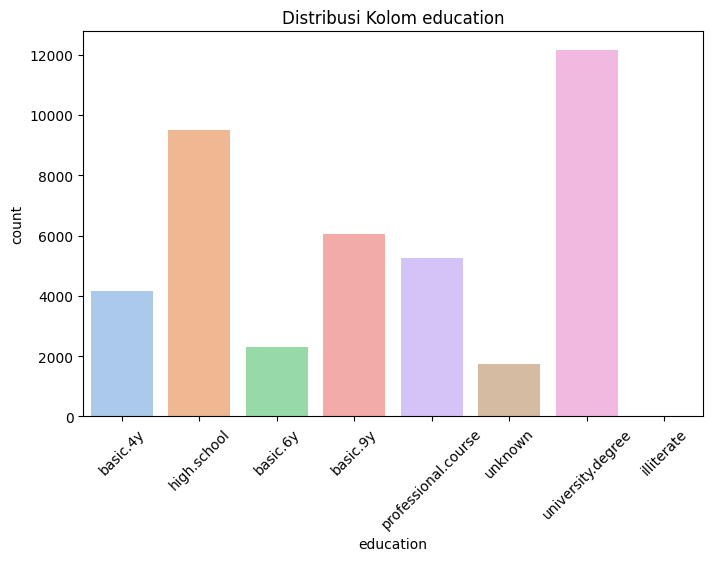

<ipython-input-14-f58cad81ba48>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=bank_data, palette='pastel')


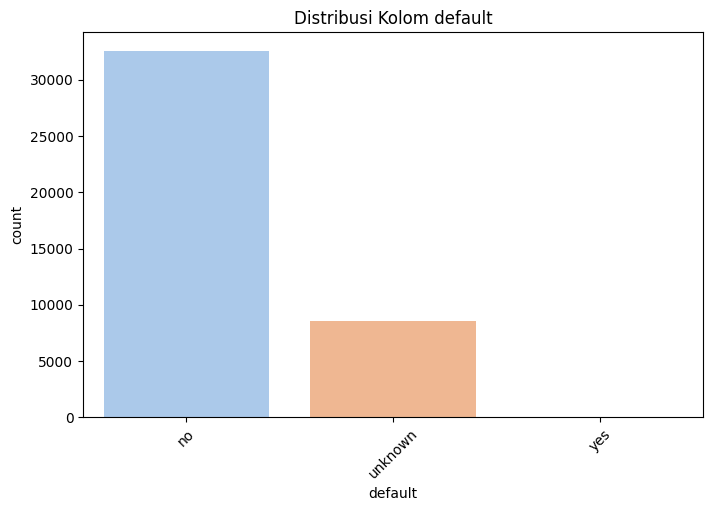

<ipython-input-14-f58cad81ba48>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=bank_data, palette='pastel')


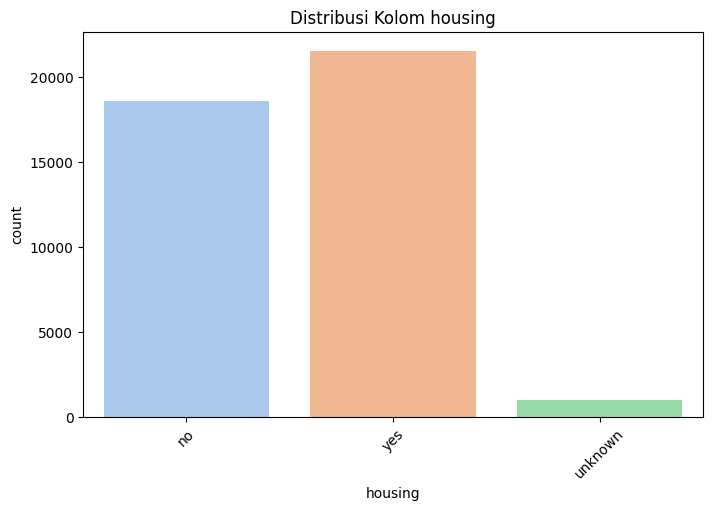

<ipython-input-14-f58cad81ba48>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=bank_data, palette='pastel')


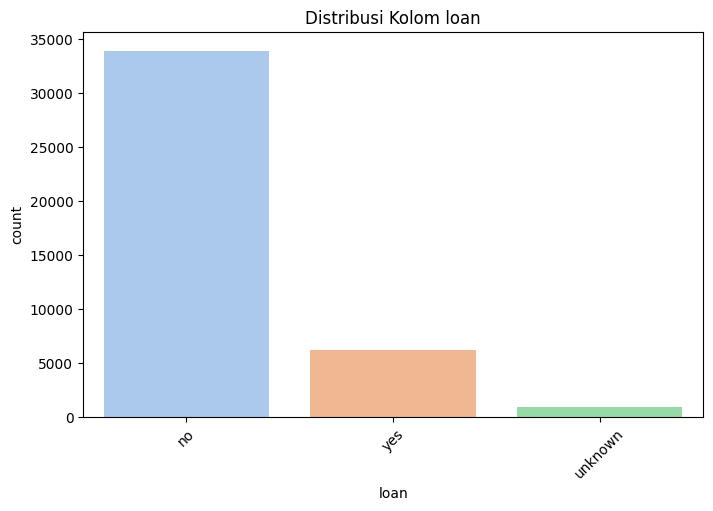

<ipython-input-14-f58cad81ba48>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=bank_data, palette='pastel')


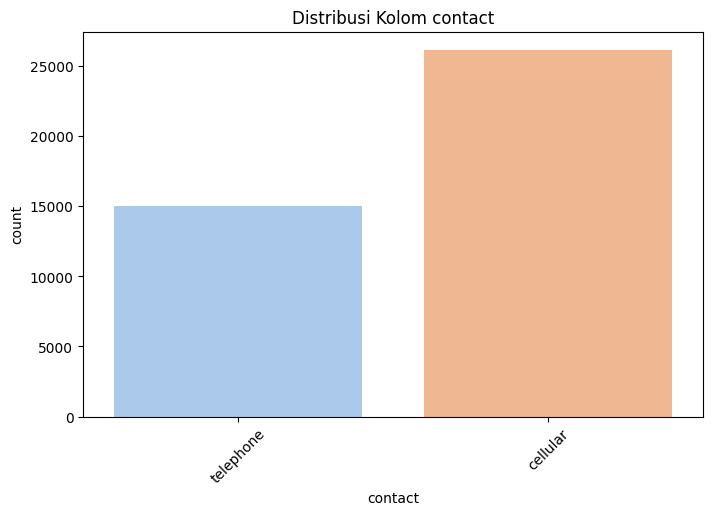

<ipython-input-14-f58cad81ba48>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=bank_data, palette='pastel')


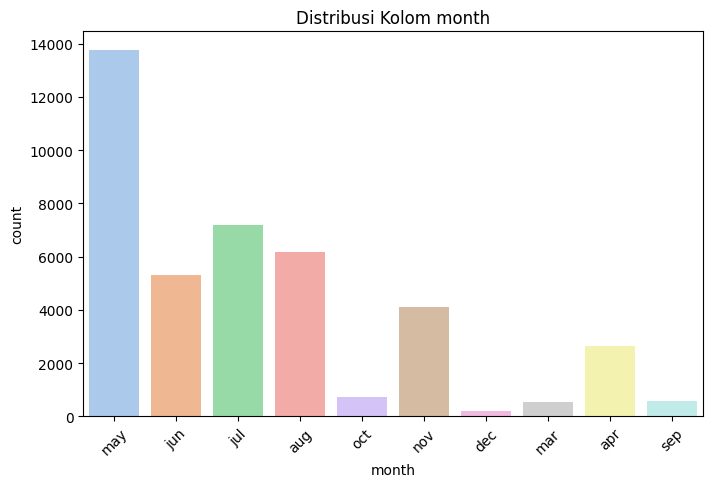

<ipython-input-14-f58cad81ba48>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=bank_data, palette='pastel')


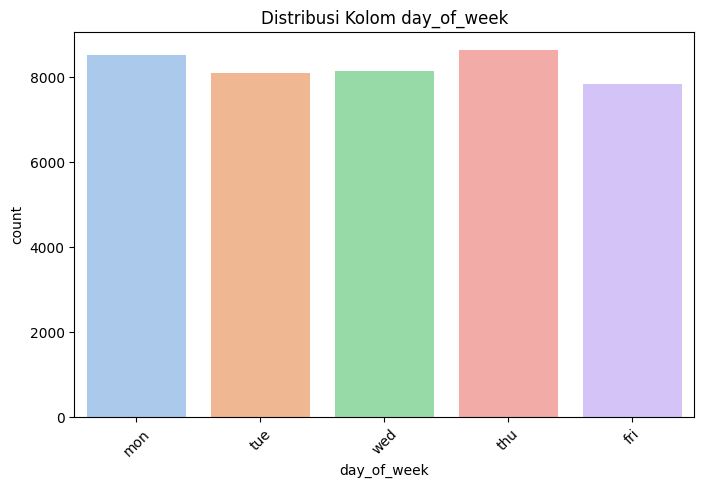

<ipython-input-14-f58cad81ba48>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=bank_data, palette='pastel')


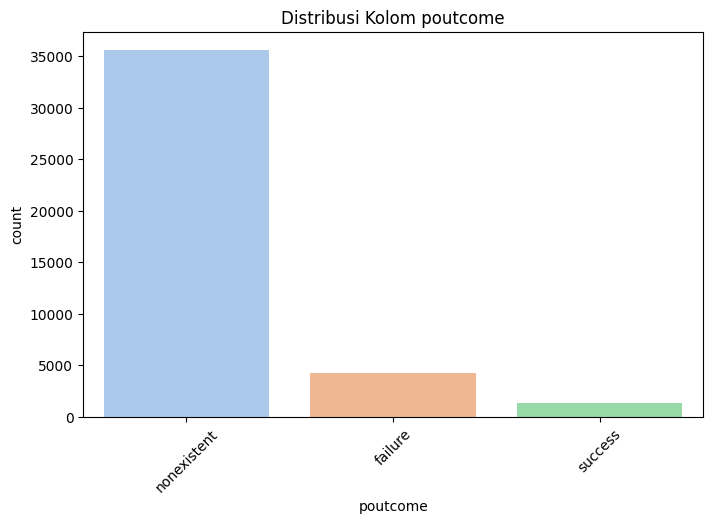

<ipython-input-14-f58cad81ba48>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=bank_data, palette='pastel')


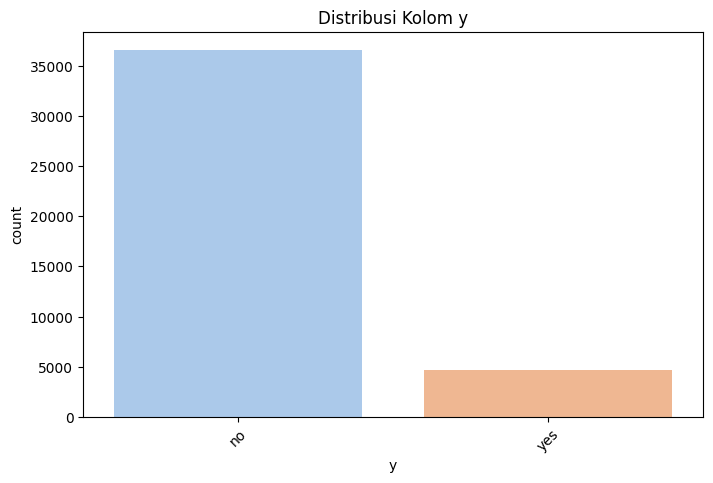

In [14]:
categorical_columns = bank_data.select_dtypes(include=['object', 'category']).columns.tolist()

for col in categorical_columns:
    plt.figure(figsize=(8, 5))
    sns.countplot(x=col, data=bank_data, palette='pastel')
    plt.title(f'Distribusi Kolom {col}')
    plt.xticks(rotation=45)
    plt.show()


#Prepocessing

##handling outliers

In [15]:
numeric_data = bank_data.select_dtypes(include=['number'])
numerical_columns = numeric_data.columns

cleaned_data = bank_data.copy()

# Fungsi untuk menangani outliers menggunakan capping
def handle_outliers(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    data[column] = np.where(data[column] < lower_bound, lower_bound, data[column])
    data[column] = np.where(data[column] > upper_bound, upper_bound, data[column])
    return data

for col in numerical_columns:
    cleaned_data = handle_outliers(cleaned_data, col)

print(cleaned_data[numerical_columns].info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  float64
 1   duration        41188 non-null  float64
 2   campaign        41188 non-null  float64
 3   pdays           41188 non-null  float64
 4   previous        41188 non-null  float64
 5   emp.var.rate    41188 non-null  float64
 6   cons.price.idx  41188 non-null  float64
 7   cons.conf.idx   41188 non-null  float64
 8   euribor3m       41188 non-null  float64
 9   nr.employed     41188 non-null  float64
dtypes: float64(10)
memory usage: 3.1 MB
None


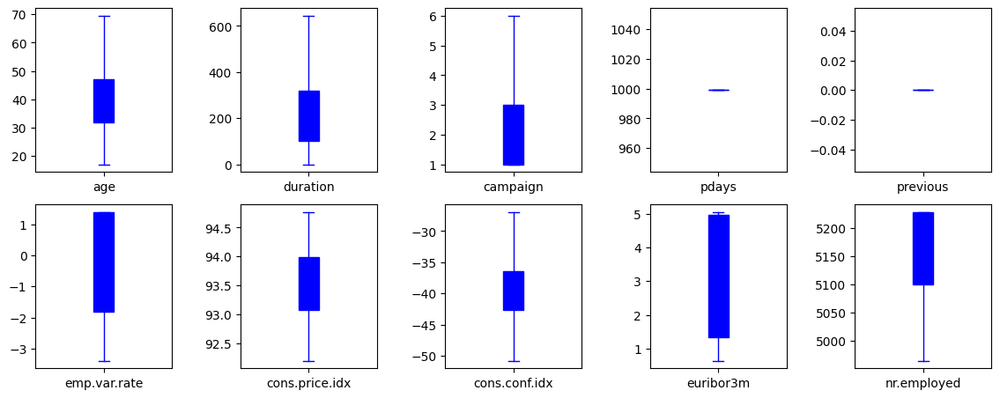

In [16]:
numeric_data=cleaned_data.select_dtypes(exclude=["object"])
numeric_data.plot(subplots =True, kind = 'box', layout = (5,5), figsize = (14,14),patch_artist=True,color="b")
plt.subplots_adjust(wspace = 0.5)

##label encoding

In [17]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

for col in categorical_columns:
  cleaned_data[col] = le.fit_transform(cleaned_data[col])

print(cleaned_data.head())

    age  job  marital  education  default  housing  loan  contact  month  \
0  56.0    3        1          0        0        0     0        1      6   
1  57.0    7        1          3        1        0     0        1      6   
2  37.0    7        1          3        0        2     0        1      6   
3  40.0    0        1          1        0        0     0        1      6   
4  56.0    7        1          3        0        0     2        1      6   

   day_of_week  ...  campaign  pdays  previous  poutcome  emp.var.rate  \
0            1  ...       1.0  999.0       0.0         1           1.1   
1            1  ...       1.0  999.0       0.0         1           1.1   
2            1  ...       1.0  999.0       0.0         1           1.1   
3            1  ...       1.0  999.0       0.0         1           1.1   
4            1  ...       1.0  999.0       0.0         1           1.1   

   cons.price.idx  cons.conf.idx  euribor3m  nr.employed  y  
0          93.994          -36.4    

In [18]:
cleaned_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  float64
 1   job             41188 non-null  int64  
 2   marital         41188 non-null  int64  
 3   education       41188 non-null  int64  
 4   default         41188 non-null  int64  
 5   housing         41188 non-null  int64  
 6   loan            41188 non-null  int64  
 7   contact         41188 non-null  int64  
 8   month           41188 non-null  int64  
 9   day_of_week     41188 non-null  int64  
 10  duration        41188 non-null  float64
 11  campaign        41188 non-null  float64
 12  pdays           41188 non-null  float64
 13  previous        41188 non-null  float64
 14  poutcome        41188 non-null  int64  
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

##cek kolom dengan korelasi tinggi

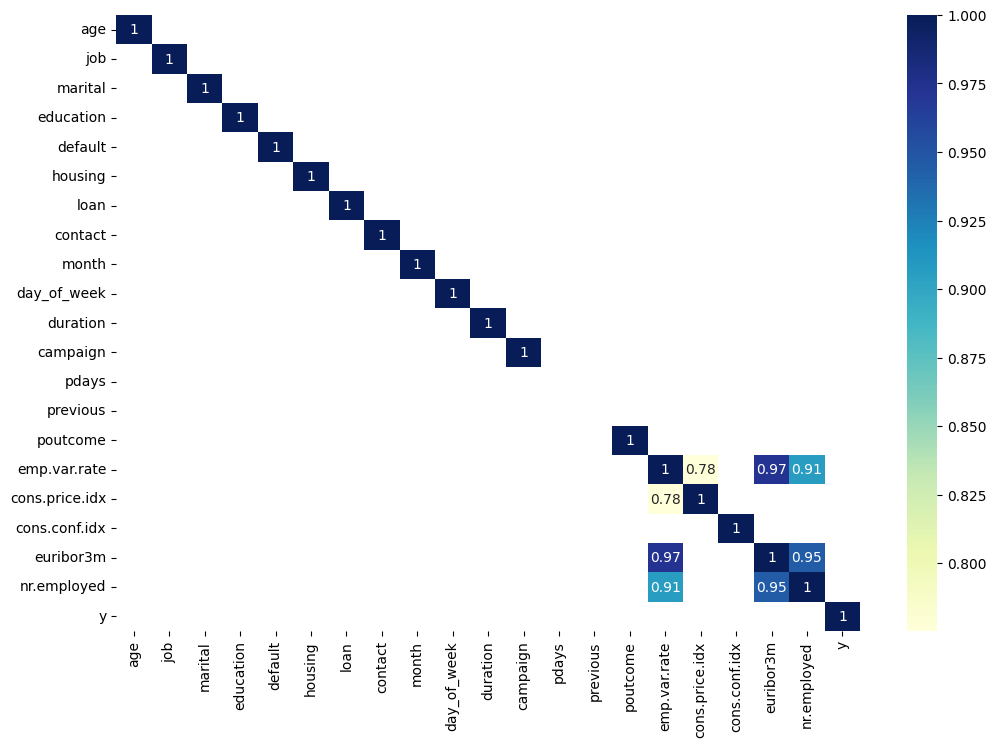

In [19]:
corr = cleaned_data.corr()
corr_greater_than_75 = corr[corr>=.75]
plt.figure(figsize=(12,8))
sns.heatmap(corr_greater_than_75, annot = True , cmap = "YlGnBu");

Korelasi dengan target variable 'y':
 y                 1.000000
duration          0.401286
poutcome          0.129789
education         0.057799
cons.conf.idx     0.054789
marital           0.046203
job               0.025122
age               0.020941
day_of_week       0.015967
housing           0.011552
loan             -0.004909
month            -0.006065
campaign         -0.069400
default          -0.099352
cons.price.idx   -0.136211
contact          -0.144773
emp.var.rate     -0.298334
euribor3m        -0.307771
nr.employed      -0.354678
pdays                  NaN
previous               NaN
Name: y, dtype: float64


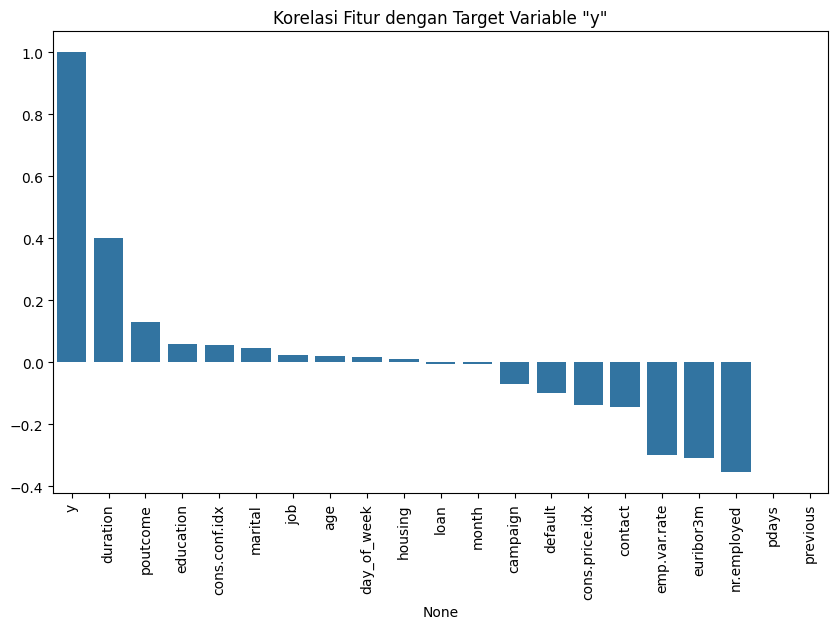

In [20]:
correlation_with_y = cleaned_data.corr()['y'].sort_values(ascending=False)

print("Korelasi dengan target variable 'y':\n", correlation_with_y)

plt.figure(figsize=(10, 6))
sns.barplot(x=correlation_with_y.index, y=correlation_with_y.values)
plt.title('Korelasi Fitur dengan Target Variable "y"')
plt.xticks(rotation=90)
plt.show()

##drop column yang memiliki korelasi rendah dengan target

In [21]:
cleaned_data.drop(['pdays', 'previous', 'month', 'loan'], axis=1, inplace = True)

In [22]:
cleaned_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  float64
 1   job             41188 non-null  int64  
 2   marital         41188 non-null  int64  
 3   education       41188 non-null  int64  
 4   default         41188 non-null  int64  
 5   housing         41188 non-null  int64  
 6   contact         41188 non-null  int64  
 7   day_of_week     41188 non-null  int64  
 8   duration        41188 non-null  float64
 9   campaign        41188 non-null  float64
 10  poutcome        41188 non-null  int64  
 11  emp.var.rate    41188 non-null  float64
 12  cons.price.idx  41188 non-null  float64
 13  cons.conf.idx   41188 non-null  float64
 14  euribor3m       41188 non-null  float64
 15  nr.employed     41188 non-null  float64
 16  y               41188 non-null  int64  
dtypes: float64(8), int64(9)
memory 

##drop feature with high correlation

In [23]:
cleaned_data.drop(['nr.employed', 'emp.var.rate'], axis=1, inplace = True)

##train-test split

In [24]:
import pandas as pd
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

X = cleaned_data.drop('y', axis=1)
y = cleaned_data['y']

smote = SMOTE(random_state=42)
X_res, y_res = smote.fit_resample(X, y)

X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.2, random_state=42)

In [25]:
X_train.shape

(58476, 14)

In [26]:
X_test.shape

(14620, 14)

#Modeling

##XGBOOST

In [27]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix


xgb_model = XGBClassifier(random_state=42)

xgb_model.fit(X_train, y_train)
y_pred = xgb_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Akurasi:", accuracy)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

Akurasi: 0.9477428180574555

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.94      0.95      7332
           1       0.94      0.95      0.95      7288

    accuracy                           0.95     14620
   macro avg       0.95      0.95      0.95     14620
weighted avg       0.95      0.95      0.95     14620


Confusion Matrix:
[[6908  424]
 [ 340 6948]]


##K-Nearest Neighbors (KNN)

###with elbow method

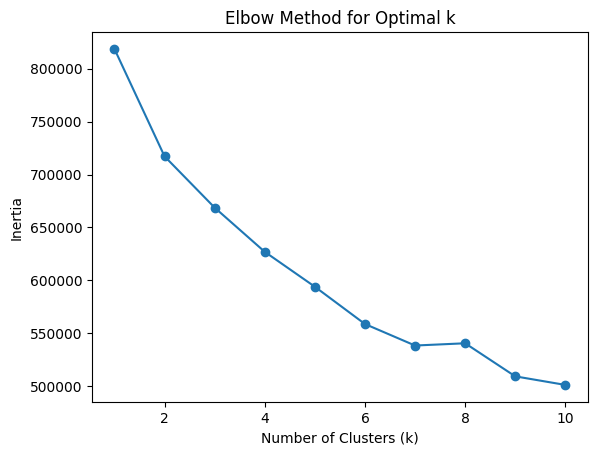

In [28]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

inertia = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.show()

In [29]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

knn_model = KNeighborsClassifier(n_neighbors=7)

knn_model.fit(X_train, y_train)

y_pred_knn = knn_model.predict(X_test)

accuracy_knn = accuracy_score(y_test, y_pred_knn)
print("Akurasi KNN:", accuracy_knn)

print("\nClassification Report KNN:")
print(classification_report(y_test, y_pred_knn))

print("\nConfusion Matrix KNN:")
print(confusion_matrix(y_test, y_pred_knn))

Akurasi KNN: 0.9138166894664843

Classification Report KNN:
              precision    recall  f1-score   support

           0       0.99      0.84      0.91      7332
           1       0.86      0.99      0.92      7288

    accuracy                           0.91     14620
   macro avg       0.92      0.91      0.91     14620
weighted avg       0.92      0.91      0.91     14620


Confusion Matrix KNN:
[[6139 1193]
 [  67 7221]]


###with gridsearch

In [30]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV

knn_model = KNeighborsClassifier()

param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']
}

grid_search = GridSearchCV(estimator=knn_model, param_grid=param_grid, cv=5, scoring='accuracy')

grid_search.fit(X_train, y_train)

print("Parameter terbaik:", grid_search.best_params_)

best_knn_model = grid_search.best_estimator_
y_pred = best_knn_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Akurasi:", accuracy)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

Parameter terbaik: {'metric': 'manhattan', 'n_neighbors': 3, 'weights': 'distance'}
Akurasi: 0.9368673050615595

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.88      0.93      7332
           1       0.89      1.00      0.94      7288

    accuracy                           0.94     14620
   macro avg       0.94      0.94      0.94     14620
weighted avg       0.94      0.94      0.94     14620


Confusion Matrix:
[[6436  896]
 [  27 7261]]


##Random forest

In [31]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix


scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

rf_model = RandomForestClassifier(
    bootstrap=False,
    criterion='entropy',
    max_features=0.5,
    min_samples_leaf=1,
    min_samples_split=13,
    n_estimators=100,
    random_state=42
)

rf_model.fit(X_train_scaled, y_train)

y_pred_rf = rf_model.predict(X_test_scaled)

accuracy_rf = accuracy_score(y_test, y_pred_rf)
print("Akurasi Random Forest:", accuracy_rf)

print("\nClassification Report Random Forest:")
print(classification_report(y_test, y_pred_rf))

print("\nConfusion Matrix Random Forest:")
print(confusion_matrix(y_test, y_pred_rf))

Akurasi Random Forest: 0.9509575923392612

Classification Report Random Forest:
              precision    recall  f1-score   support

           0       0.96      0.94      0.95      7332
           1       0.94      0.96      0.95      7288

    accuracy                           0.95     14620
   macro avg       0.95      0.95      0.95     14620
weighted avg       0.95      0.95      0.95     14620


Confusion Matrix Random Forest:
[[6915  417]
 [ 300 6988]]
